# Cognitive Environments - Projeto Integrado - Face & Text Extraction

## Enunciado

O setor de fraudes apontou que existem clientes que se queixaram de não contratar serviços
específicos, como o crédito pessoal. Entretanto após o indicador de Detecção de vivacidade
(liveness), desenvolvido na disciplina de Computer Vision, ter apresentado um percentual de
vivacidade menor que 90% apontou a necessidade de uma nova validação do self da pessoa com o
documento.

- 1. Extração da Face, Nome e CPF
- 2. Comparação de faces(precisam ter mais de 90% de semelhança)
- 3. Extração do Nome e Endereço. Nome precisa ser o mesmo da CNH

## Integrantes


    1) Nome: Jéssica Portela de Castro    RM: 359735
    2) Nome: Tiago Freire Barbosa         RM: 358404

## Importação das Bibliotecas

In [107]:
!pip install boto3 --quiet

import boto3, getpass, tempfile, os, re, requests
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display
from io import BytesIO

## Chaves de API AWS

Por segurança, a cada nova execução do notebook, as chaves de API devem ser fornecidas

In [108]:
ACCESS_ID = getpass.getpass("Digite sua ACESS_ID: ")
ACCESS_KEY = getpass.getpass("Digite sua ACCESS_KEY: ")
region = "us-east-1"

Digite sua ACESS_ID: ··········
Digite sua ACCESS_KEY: ··········


## Definição de arquivos de imagem e fontes

Os arquivos utilizados neste trabalho foram gerados através de IA e estão hospedados no repositório público do github do projeto

In [109]:
url_file_name_source = "https://raw.githubusercontent.com/tiagofrbarbosa/MBA-FIAP-Cognitive-Environments-Face-Text-Extraction/refs/heads/master/images/documents/CNH-Maria.png"

url_file_name_target = "https://raw.githubusercontent.com/tiagofrbarbosa/MBA-FIAP-Cognitive-Environments-Face-Text-Extraction/refs/heads/master/images/selfies/Selfie-Maria.png"

url_file_name_utility_bills = "https://raw.githubusercontent.com/tiagofrbarbosa/MBA-FIAP-Cognitive-Environments-Face-Text-Extraction/refs/heads/master/images/utility_bills/Conta-Consumo-Maria.png"

url_file_name_font = "https://github.com/tiagofrbarbosa/MBA-FIAP-Cognitive-Environments-Face-Text-Extraction/raw/refs/heads/master/images/fonts/arial.ttf"

# Amazon Rekognition

Este trecho de código realiza a comparação de similaridade entre duas imagens utilizando o serviço Amazon Rekognition. Primeiro, ele converte URLs de imagens em arquivos no formato bytes para envio à API da AWS. Em seguida, inicia uma sessão autenticada com as credenciais da AWS e utiliza o método compare_faces para comparar rostos entre a imagem de origem e a imagem de destino, retornando como resposta os pares de rostos semelhantes com base em um limiar mínimo de similaridade de 95%. Ideal para tarefas de reconhecimento facial e verificação de identidade.

In [110]:
def image_url_to_bytes(url):
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert("RGB")
    buffer = BytesIO()
    image.save(buffer, format="JPEG")
    return buffer.getvalue()

bytes_file_source = image_url_to_bytes(url_file_name_source)
bytes_file_target = image_url_to_bytes(url_file_name_target)

bytes_file_utility_bills = image_url_to_bytes(url_file_name_utility_bills)

session = boto3.Session(aws_access_key_id=ACCESS_ID, aws_secret_access_key= ACCESS_KEY)

rekognition_client = session.client("rekognition", region_name=region)

rekognition_response = rekognition_client.compare_faces(
    SourceImage={'Bytes': bytes_file_source},
    TargetImage={'Bytes': bytes_file_target},
    SimilarityThreshold=95
)

## Rekognition Response

A resposta da API Amazon Rekognition indica que foi detectado um rosto na imagem de origem e que houve uma correspondência facial bem-sucedida com a imagem de destino<br>

O Amazon Rekognition detectou um rosto na imagem de origem e o comparou com sucesso com um rosto da imagem de destino, apresentando 99,99996% de similaridade, o que indica que os rostos são praticamente idênticos. A detecção foi feita com altíssima confiança e boa qualidade de imagem.

In [111]:
rekognition_response

{'SourceImageFace': {'BoundingBox': {'Width': 0.12639957666397095,
   'Height': 0.273791640996933,
   'Left': 0.19220475852489471,
   'Top': 0.32348963618278503},
  'Confidence': 99.99938201904297},
 'FaceMatches': [{'Similarity': 99.99996948242188,
   'Face': {'BoundingBox': {'Width': 0.4374382197856903,
     'Height': 0.5759308934211731,
     'Left': 0.37202581763267517,
     'Top': 0.15759000182151794},
    'Confidence': 99.9998779296875,
    'Landmarks': [{'Type': 'eyeLeft',
      'X': 0.47818124294281006,
      'Y': 0.3939673602581024},
     {'Type': 'eyeRight', 'X': 0.6771158576011658, 'Y': 0.3930463194847107},
     {'Type': 'mouthLeft', 'X': 0.49328023195266724, 'Y': 0.5896306037902832},
     {'Type': 'mouthRight', 'X': 0.6590787768363953, 'Y': 0.5888783931732178},
     {'Type': 'nose', 'X': 0.5692203044891357, 'Y': 0.5007179975509644}],
    'Pose': {'Roll': -0.6771056652069092,
     'Yaw': -2.8931663036346436,
     'Pitch': 1.889083981513977},
    'Quality': {'Brightness': 86.1

## BoundingBox

Este trecho carrega a imagem de origem a partir de uma URL, converte-a para o formato RGB e utiliza as informações de bounding box retornadas pela Amazon Rekognition para identificar e desenhar um retângulo ao redor do rosto detectado. As coordenadas da face são convertidas de valores relativos (percentuais) para valores absolutos em pixels com base na dimensão da imagem. Por fim, a área do rosto é destacada com um contorno verde.

In [112]:
response_source = requests.get(url_file_name_source)
image = Image.open(BytesIO(response_source.content)).convert("RGB")

imgWidth, imgHeight = image.size
draw = ImageDraw.Draw(image)
box = rekognition_response["SourceImageFace"]["BoundingBox"]

left = int(box['Left'] * imgWidth)
top = int(box['Top'] * imgHeight)
width = int(box['Width'] * imgWidth)
height = int(box['Height'] * imgHeight)

print(f"Left: {left}")
print(f"Top: {top}")
print(f"Face Width: {width}")
print(f"Face Height: {height}")

draw.rectangle([left, top, left + width, top + height], outline='#00d400', width=3)

Left: 295
Top: 331
Face Width: 194
Face Height: 280


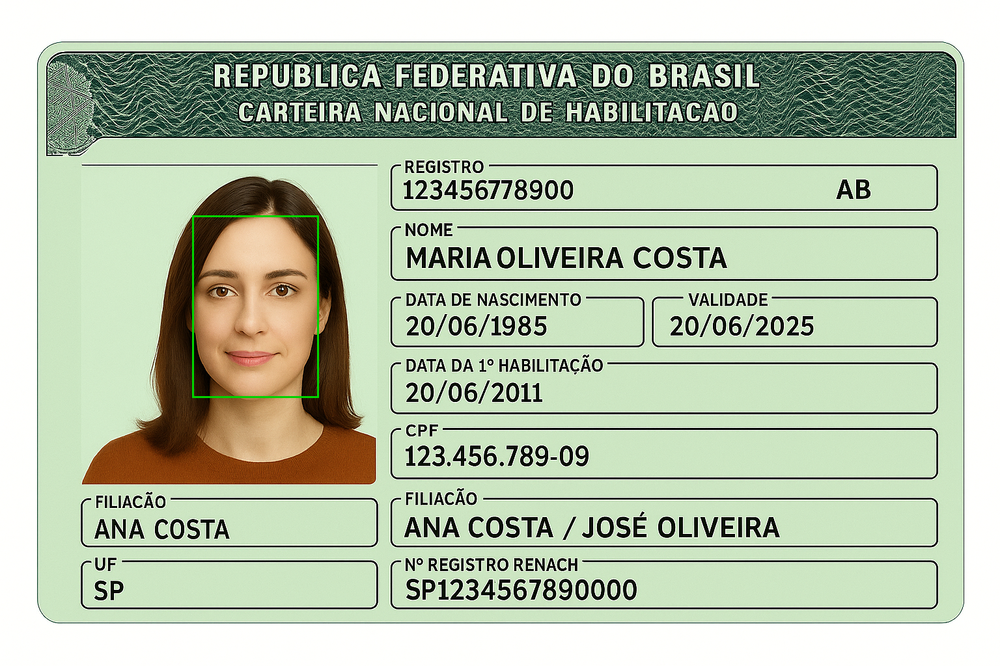

In [113]:
image

## FaceMatches

Este código carrega a imagem de destino a partir de uma URL e utiliza os dados retornados pela Amazon Rekognition para identificar os rostos semelhantes ao da imagem de origem. Para cada face correspondente, ele:

- Calcula a posição e o tamanho da face com base nas dimensões da imagem.

- Desenha um retângulo ao redor da face detectada.

- Adiciona uma anotação com o valor de similaridade retornado pela API.

Além disso, o código baixa uma fonte personalizada para renderizar o texto de forma adequada na imagem. Esse processo é útil para visualizar os resultados da comparação facial diretamente sobre a imagem analisada.

In [114]:
response_target = requests.get(url_file_name_target)
image = Image.open(BytesIO(response_target.content)).convert("RGB")

imgWidth, imgHeight = image.size

response_font = requests.get(url_file_name_font)

font_filename = url_file_name_font.split('/')[-1]
temp_font_path = os.path.join(tempfile.gettempdir(), font_filename)
with open(temp_font_path, 'wb') as f:
    f.write(response_font.content)

font = ImageFont.truetype(temp_font_path, 20)

draw = ImageDraw.Draw(image)

for item_match in rekognition_response["FaceMatches"]:
  print("Face Localizada: " + str(item_match))

  box = item_match["Face"]["BoundingBox"]

  top = imgHeight * box['Top']
  left = imgWidth * box['Left']
  width = imgWidth * box['Width']
  height = imgHeight * box['Height']

  print("Left: " + "{0:.0f}".format(left))
  print("Top: " + "{0:.0f}".format(top))
  print("Face Width: " + "{0:.0f}".format(width))
  print("Face Height: " + "{0:.0f}".format(height))

  draw.rectangle([left,top, left + width, top + height], outline='#00d400')
  draw.text((left, top), "Similaridade: "+ str(item_match["Similarity"]), font=font)

  print("Similaridade: " + str(item_match["Similarity"]))

Face Localizada: {'Similarity': 99.99996948242188, 'Face': {'BoundingBox': {'Width': 0.4374382197856903, 'Height': 0.5759308934211731, 'Left': 0.37202581763267517, 'Top': 0.15759000182151794}, 'Confidence': 99.9998779296875, 'Landmarks': [{'Type': 'eyeLeft', 'X': 0.47818124294281006, 'Y': 0.3939673602581024}, {'Type': 'eyeRight', 'X': 0.6771158576011658, 'Y': 0.3930463194847107}, {'Type': 'mouthLeft', 'X': 0.49328023195266724, 'Y': 0.5896306037902832}, {'Type': 'mouthRight', 'X': 0.6590787768363953, 'Y': 0.5888783931732178}, {'Type': 'nose', 'X': 0.5692203044891357, 'Y': 0.5007179975509644}], 'Pose': {'Roll': -0.6771056652069092, 'Yaw': -2.8931663036346436, 'Pitch': 1.889083981513977}, 'Quality': {'Brightness': 86.10536193847656, 'Sharpness': 98.08562469482422}}}
Left: 181
Top: 84
Face Width: 213
Face Height: 306
Similaridade: 99.99996948242188


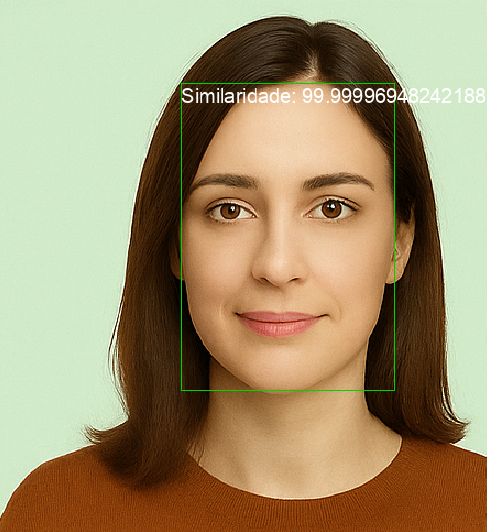

In [115]:
image

# Amazon Textract (CNH)

Este trecho de código utiliza o serviço Amazon Textract para realizar a detecção de texto bruto (OCR) em um documento (por exemplo, uma imagem ou PDF). A detecção é feita com o método detect_document_text, que retorna todos os textos visíveis no documento

In [116]:
textract_client = session.client("textract", region_name=region)

response = textract_client.detect_document_text(
    Document={'Bytes': bytes_file_source}
)

## Textract Response

processamos o texto retornado pelo Textract com o objetivo de identificar duas informações principais:

CPF: utilizamos uma expressão regular para localizar o padrão 000.000.000-00 no texto completo.

Nome: procuramos pela palavra "NOME" (em qualquer caixa) e assumimos que o valor correspondente está logo na linha seguinte.

In [117]:
all_text = "\n".join([item["Text"] for item in response["Blocks"] if item["BlockType"] == "LINE"])

cpf_match = re.search(r'\d{3}\.\d{3}\.\d{3}-\d{2}', all_text)
cpf_cnh = cpf_match.group() if cpf_match else "CPF não encontrado"

nome_cnh = None
linhas = all_text.split("\n")
for i, linha in enumerate(linhas):
    if "NOME" in linha.upper():
        nome_cnh = linhas[i+1].strip() if i+1 < len(linhas) else None
        break

print(f"Nome: {nome_cnh}")
print(f"CPF: {cpf_cnh}")


Nome: MARIA OLIVEIRA COSTA
CPF: 123.456.789-09


## BoundingBox

Destaque das BoundingBox ao redor dos dados de nome e cpf extraídos

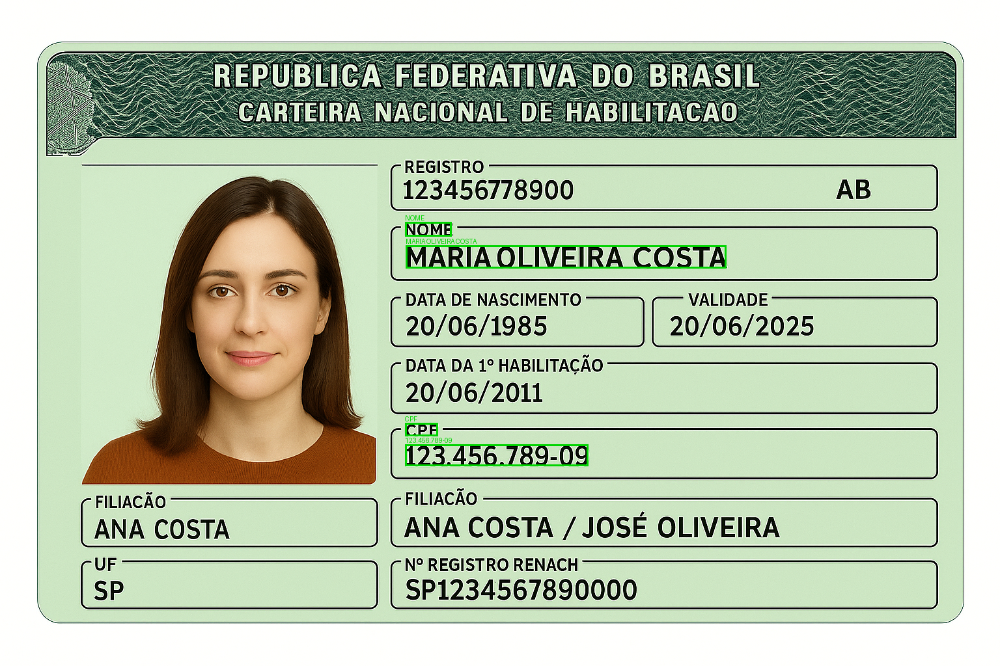

In [118]:
response_source = requests.get(url_file_name_source)
image = Image.open(BytesIO(response_source.content)).convert("RGB")

imgWidth, imgHeight = image.size
draw = ImageDraw.Draw(image)

regex_cpf = re.compile(r'\d{3}\.\d{3}\.\d{3}-\d{2}')

indices_para_contornar = []
linhas = [block for block in response["Blocks"] if block["BlockType"] == "LINE"]

nome = cpf = None

for i, block in enumerate(linhas):
    texto = block["Text"].strip()

    if "NOME" in texto.upper():
        if i + 1 < len(linhas):
            nome = linhas[i + 1]["Text"].strip()
            indices_para_contornar += [i, i + 1]

    if texto.strip().upper() == "CPF":
        indices_para_contornar.append(i)

    if regex_cpf.fullmatch(texto):
        cpf = texto
        indices_para_contornar.append(i)

for idx in indices_para_contornar:
    block = linhas[idx]
    box = block["Geometry"]["BoundingBox"]
    left = int(box["Left"] * imgWidth)
    top = int(box["Top"] * imgHeight)
    width = int(box["Width"] * imgWidth)
    height = int(box["Height"] * imgHeight)

    draw.rectangle([left, top, left + width, top + height], outline="#00d400", width=3)
    draw.text((left, top - 12), block["Text"], fill="#00d400")

display(image)

# Amazon Textract (Conta de Consumo)

Este trecho de código utiliza o serviço Amazon Textract para realizar a detecção de texto bruto (OCR) em um documento (por exemplo, uma imagem ou PDF). A detecção é feita com o método detect_document_text, que retorna todos os textos visíveis no documento

In [119]:
textract_client = session.client("textract", region_name=region)

response = textract_client.detect_document_text(
    Document={'Bytes': bytes_file_utility_bills}
)

## Textract Response

Neste trecho de código, processamos o texto extraído pelo Amazon Textract com o objetivo de localizar informações específicas: o nome do cliente e o endereço de fornecimento. Para isso, primeiro unimos todas as linhas detectadas em um único texto contínuo, separando por quebras de linha. Em seguida, usamos expressões regulares para buscar padrões como “Nome do Cliente:” e “Endereço de Fornecimento:”, assumindo que os respectivos valores aparecem logo após os dois-pontos. Se os padrões forem encontrados, extraímos e limpamos os valores; caso contrário, uma mensagem padrão é atribuída. Por fim, os valores extraídos são exibidos, permitindo validar rapidamente se as informações foram corretamente localizadas no documento.

In [120]:
all_text = "\n".join([item["Text"] for item in response["Blocks"] if item["BlockType"] == "LINE"])

endereco_match = re.search(r'Endereço de Fornenecimento:\s*(.*)', all_text)
endereco_conta = endereco_match.group(1).strip() if endereco_match else "Endereço não encontrado"

nome_match = re.search(r'Nome do Cliente:\s*(.*)', all_text)
nome_conta = nome_match.group(1).strip() if nome_match else "Nome não encontrado"

print(f"Nome: {nome_conta}")
print(f"Endereço: {endereco_conta}")


Nome: Maria Oliveira Costa
Endereço: Rua das Flores, 123 - Apto 45


## BoundingBox

Destaque das BoundingBox ao redor dos dados de nome e endereço de fornecimento extraídos

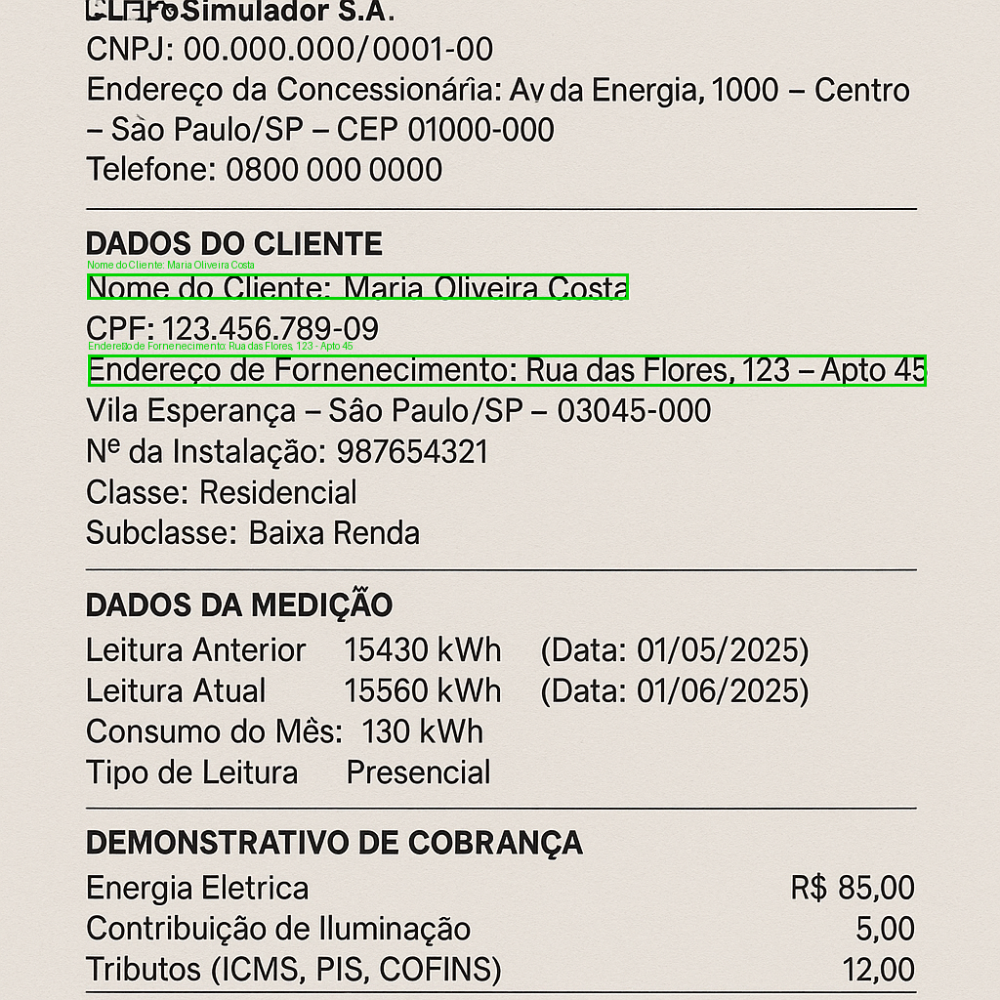

In [121]:
response_source = requests.get(url_file_name_utility_bills)
image = Image.open(BytesIO(response_source.content)).convert("RGB")

imgWidth, imgHeight = image.size
draw = ImageDraw.Draw(image)

linhas = [block for block in response["Blocks"] if block["BlockType"] == "LINE"]

indices_para_contornar = []

for i, block in enumerate(linhas):
    texto = block["Text"].strip()

    if "nome do cliente" in texto.lower():
        indices_para_contornar.append(i)

    if "endereço de fornenecimento" in texto.lower():
        indices_para_contornar.append(i)

for idx in indices_para_contornar:
    block = linhas[idx]
    box = block["Geometry"]["BoundingBox"]
    left = int(box["Left"] * imgWidth)
    top = int(box["Top"] * imgHeight)
    width = int(box["Width"] * imgWidth)
    height = int(box["Height"] * imgHeight)

    draw.rectangle([left, top, left + width, top + height], outline="#00d400", width=3)
    draw.text((left, top - 15), block["Text"], fill="#00d400")

display(image)


# Autenticação

In [122]:
similaridade = item_match["Similarity"]

if similaridade > 90 and nome_cnh.lower() == nome_conta.lower():
    print("Cliente autenticado com sucesso!")
else:
    print("Cliente não pode ser autenticado")

Cliente autenticado com sucesso!
